In [1]:
%reload_ext autoreload
%autoreload 2

import sys
import matplotlib.cm as cm

sys.path.append('./Mouse brain network/MouseBrainLib2.0')

import networkx as nx
import matplotlib.pyplot as plt
import DataUtils as dutl
import numpy as np
import matplotlib as mpl
from matplotlib.colors import Normalize
import matplotlib.cm as cm
import matplotlib.transforms as mtransforms

mpl.rcParams.update(mpl.rcParamsDefault)

import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors

In [2]:
import matplotlib.font_manager as fm

TEXT_FONT_SIZE = 7
TITLE_FONT_SIZE = 7.5
MARKER_SIZE = 2
LINE_WIDTH = 1

plt.rcParams['font.size'] = TEXT_FONT_SIZE 
plt.rcParams['axes.linewidth'] = 0.2
plt.rcParams['lines.linewidth'] = 2
mpl.rcParams['legend.fontsize'] = TEXT_FONT_SIZE
mpl.rcParams['axes.titlesize'] = TITLE_FONT_SIZE 
mpl.rcParams['axes.labelsize'] = TEXT_FONT_SIZE 
plt.rcParams['axes.facecolor'] = '#F8F8F8'

color_cycle = ['#AA4499', '#332288', '#88CCEE', '#44AA99', '#117733', '#999933', '#DDCC77', '#CC6677', '#882255']

plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.serif'] = 'Symbol'

**Small world network**

Average degree:  44.0
Average shortest path length:  1.9716040100250627
Avg clustering coefficient:  0.3594402478513359


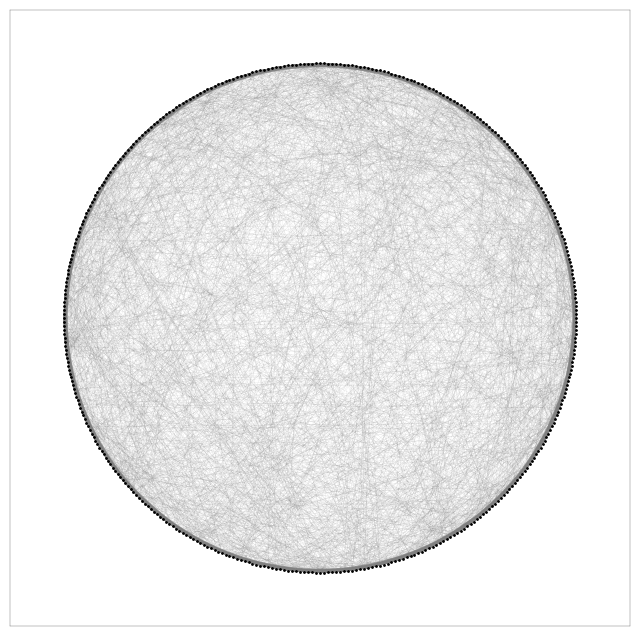

In [18]:
G_SWN = nx.watts_strogatz_graph(n = 400, k = 45, p = 0.232)
A = np.mat(nx.adjacency_matrix(G_SWN).todense())
K = np.sum(A, axis=1)

print("Average degree: ", np.mean(K))
print("Average shortest path length: ", nx.average_shortest_path_length(G_SWN))
print("Avg clustering coefficient: ", nx.average_clustering(G_SWN))

#print("Small-worldness: ", nx.omega(self.G))

pos = nx.circular_layout(G_SWN)

node_size = 1
edge_width = 0.05
node_color = 'black'
edge_color = 'gray'

#Node's degree
K = np.mat(np.zeros([426, 1]))
K = np.sum(A, axis=1)

# Calculate the degree distribution
swn_degree_dist = np.asarray(K.T)[0]
swn_unique_degrees = np.unique(swn_degree_dist)
swn_count_degrees = [np.count_nonzero(swn_degree_dist == degree) for degree in swn_unique_degrees]

# Draw the graph
fig, ax = plt.subplots(figsize=(8,8))
nx.draw_networkx(G_SWN, pos, node_size=node_size, width=edge_width, node_color=node_color, edge_color=edge_color, with_labels=False)
plt.show()

**Random Network**

Average degree:  44.0
Average shortest path length:  1.8954135338345866
Avg clustering coefficient:  0.10745842228768174


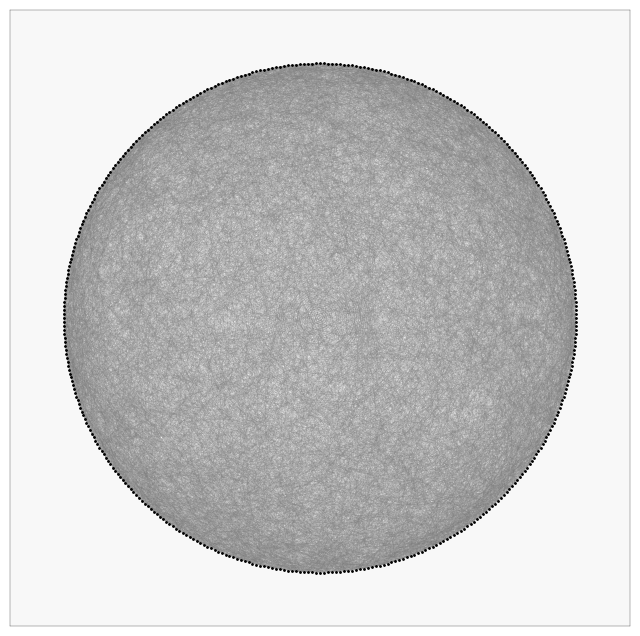

In [4]:
G_RND = nx.watts_strogatz_graph(n = 400, k = 45, p = 1) #0.232
A = np.mat(nx.adjacency_matrix(G_RND).todense())
K = np.sum(A, axis=1)

print("Average degree: ", np.mean(K))
print("Average shortest path length: ", nx.average_shortest_path_length(G_RND))
print("Avg clustering coefficient: ", nx.average_clustering(G_RND))
#print("Small-worldness: ", nx.omega(self.G))

pos = nx.circular_layout(G_RND)
# Set node and edge properties
node_size = 1
edge_width = 0.05
node_color = 'black'
edge_color = 'gray'

# Draw the graph
fig, ax = plt.subplots(figsize=(8,8))
nx.draw_networkx(G_RND, pos, node_size=node_size, width=edge_width, node_color=node_color, edge_color=edge_color, with_labels=False)
plt.show()

**Scale-free network**

Average shortest path length:  1.9613808340237504
Avg clustering coefficient:  0.17248395916330453


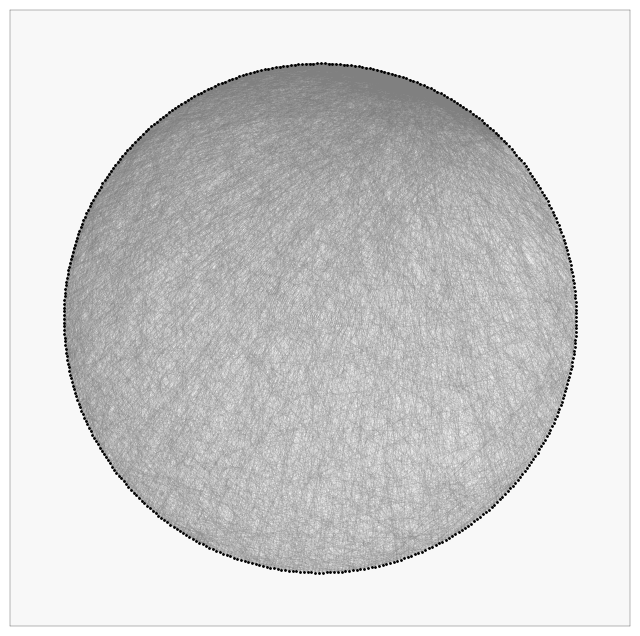

In [5]:
G_SF = nx.barabasi_albert_graph(n = 426, m = 20)

print("Average shortest path length: ", nx.average_shortest_path_length(G_SF))
print("Avg clustering coefficient: ", nx.average_clustering(G_SF))
# small_w = nx.omega(G_SF)
# print("Small-worldness: ", small_w)
# np.savez("scale-free-small-world-coeff.npz", arr1=np.array(small_w))

pos_sf = nx.circular_layout(G_SF)

# Set node and edge properties
node_size = 1
edge_width = 0.05
node_color = 'black'
edge_color = 'gray'

# Divide the nodes into two groups
nodes = list(range(426))

# Create a new dictionary to hold node positions
pos_sf = {}
offset = np.pi/4

# Compute the positions of the left nodes (same as before)
theta = np.linspace(0, 2*np.pi*(425)/426, 426) + offset
pos_sf.update({nodes[i]: np.array([np.cos(theta[i]), np.sin(theta[i])]) for i in range(426)})

# Draw the graph
fig, ax = plt.subplots(figsize=(8,8))
nx.draw_networkx(G_SF, pos_sf, node_size=node_size, width=edge_width, node_color=node_color, edge_color=edge_color, with_labels=False)
plt.show()

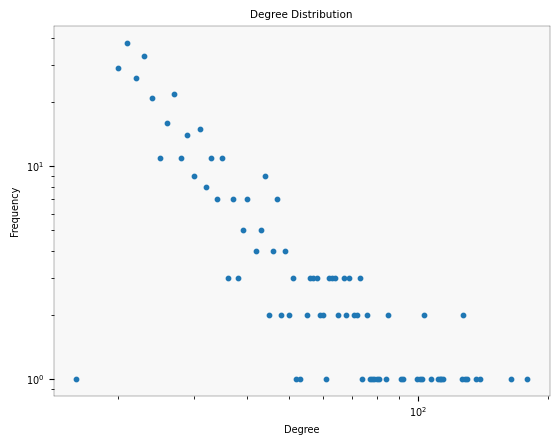

In [6]:
"""
Degree distribution
"""

A = np.mat(nx.adjacency_matrix(G_SF).todense())
BINARY_CONN = np.mat(np.zeros([426, 426]))
BINARY_CONN[:] = np.mat(np.where(A > 0, 1, 0))

#Node's degree
K = np.mat(np.zeros([426, 1]))
K = np.sum(BINARY_CONN, axis=1)

# Calculate the degree distribution
sf_degree_dist = np.asarray(K.T)[0]
sf_unique_degrees = np.unique(sf_degree_dist)
sf_count_degrees = [np.count_nonzero(sf_degree_dist == degree) for degree in sf_unique_degrees]

plt.scatter(sf_unique_degrees, sf_count_degrees, s=10)
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution')
plt.xscale('log')
plt.yscale('log')
plt.show()

**Mouse brain network**

**Sorted left node**

In [7]:
sorted_left_node = [42,
 26,
 30,
 23,
 0,
 50,
 39,
 40,
 51,
 53,
 44,
 52,
 28,
 38,
 36,
 41,
 43,
 47,
 29,
 49,
 45,
 37,
 25,
 48,
 35,
 15,
 20,
 32,
 46,
 54,
 31,
 18,
 19,
 27,
 16,
 17,
 21,
 33,
 55,
 34,
 22,
 13,
 12,
 24,
 11,
 2,
 14,
 10,
 8,
 6,
 7,
 4,
 5,
 9,
 1,
 3,
 60,
 62,
 63,
 64,
 59,
 61,
 65,
 56,
 58,
 57,
 66,
 68,
 75,
 81,
 70,
 77,
 79,
 67,
 82,
 69,
 76,
 72,
 78,
 86,
 74,
 84,
 71,
 85,
 83,
 73,
 80,
 109,
 110,
 115,
 94,
 108,
 114,
 104,
 113,
 92,
 117,
 105,
 116,
 111,
 96,
 99,
 112,
 100,
 102,
 101,
 139,
 135,
 133,
 141,
 89,
 107,
 118,
 106,
 129,
 97,
 119,
 134,
 103,
 126,
 98,
 95,
 130,
 93,
 136,
 88,
 90,
 87,
 91,
 132,
 137,
 128,
 123,
 125,
 127,
 120,
 121,
 122,
 131,
 140,
 138,
 124,
 158,
 147,
 155,
 152,
 162,
 154,
 142,
 144,
 148,
 153,
 161,
 146,
 159,
 156,
 145,
 160,
 150,
 151,
 157,
 143,
 149,
 173,
 174,
 168,
 175,
 170,
 200,
 163,
 172,
 166,
 212,
 167,
 165,
 185,
 208,
 189,
 171,
 190,
 191,
 183,
 186,
 188,
 206,
 176,
 204,
 205,
 202,
 178,
 207,
 169,
 209,
 210,
 164,
 177,
 182,
 179,
 180,
 181,
 201,
 184,
 211,
 192,
 193,
 194,
 195,
 196,
 197,
 198,
 199,
 203,
 187]

/home/jupyter-avinash/ranjan_env_15_Feb_2023/Explosive Synchronization/Mouse brain/MouseBrainLib/mb_communities.npz already exists
test
Average shortest path length:  2.110709748688208
Avg clustering coefficient:  0.38124803540980345


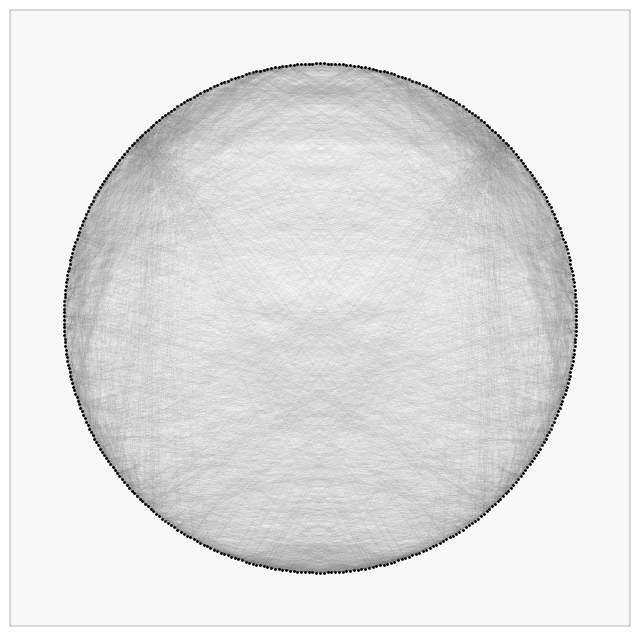

In [8]:
mb_atlas = dutl.DataUtils()

A_MB = mb_atlas.WHOLE_BRAIN_CONN 
N_MB = mb_atlas.N_REGIONS_WHOLE_BRAIN

# Create graph object from adjacency matrix
np.fill_diagonal(A_MB, 0)

BINARY_CONN = np.mat(np.zeros([N_MB, N_MB]))
BINARY_CONN[:] = np.mat(np.where(A_MB > 0, 1, 0))
        
UNDIRECTED_A = (BINARY_CONN + BINARY_CONN.T) / 2
UNDIRECTED_A[:] = np.mat(np.where(UNDIRECTED_A > 0, 1, 0))

A_MB[:] = UNDIRECTED_A
G_MB = nx.from_numpy_array(A_MB)

print("Average shortest path length: ", nx.average_shortest_path_length(G_MB))
print("Avg clustering coefficient: ", nx.average_clustering(G_MB))
#print("Small-worldness: ", nx.omega(G))

# Compute the node positions using a circular layout
pos = nx.circular_layout(G_MB, scale=1)
# Set node and edge properties
node_size = 1
edge_width = 0.02
node_color = 'black'
edge_color = 'gray'

# Divide the nodes into two groups
left_nodes = sorted_left_node #list(range(N_MB//2))
right_nodes = [x + 213 for x in sorted_left_node] #list(range(N_MB//2, N_MB))
right_nodes = right_nodes[::-1]

fig, ax = plt.subplots(figsize=(8,8))

# Create a new dictionary to hold node positions
pos2 = {}

offset = np.pi/2

# Compute the positions of the left nodes (same as before)
theta = np.linspace(0, 2*np.pi*(N_MB//2-1)/N_MB, N_MB//2) + offset
pos2.update({left_nodes[i]: np.array([np.cos(theta[i]), np.sin(theta[i])]) for i in range(N_MB//2)})

# Compute the positions of the right nodes in reverse order
theta_r = np.linspace(0, 2*np.pi*(N_MB//2-1)/N_MB, N_MB//2) + np.pi + offset
pos2.update({right_nodes[i]: np.array([np.cos(theta_r[i]), np.sin(theta_r[i])]) for i in range(N_MB//2)})


nx.draw_networkx(G_MB, pos2, nodelist=left_nodes+right_nodes, edgelist=G_MB.edges(), 
                 node_size=node_size, width=edge_width, node_color=node_color, 
                 edge_color=edge_color, with_labels=False)

plt.show()

Average degree:  45.12676056338028


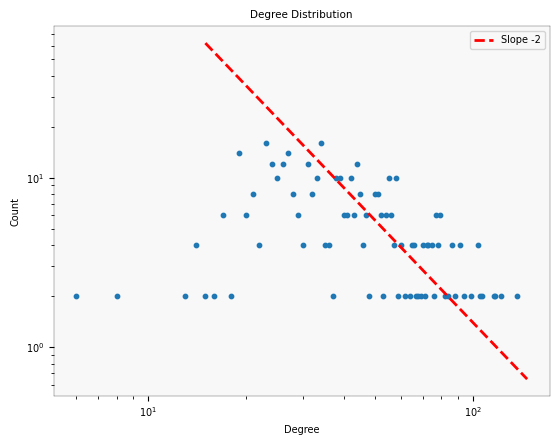

In [9]:
"""
Degree distribution
"""

# Do it after diagonal is zero
BINARY_CONN = np.mat(np.zeros([N_MB, N_MB]))
BINARY_CONN[:] = np.mat(np.where(A_MB > 0, 1, 0))

#Node's degree
K = np.mat(np.zeros([N_MB, 1]))
K = np.sum(BINARY_CONN, axis=1)

print("Average degree: ", np.mean(K))

# Calculate the degree distribution
degree_dist = np.asarray(K.T)[0]
unique_degrees = np.unique(degree_dist)
count_degrees = [np.count_nonzero(degree_dist == degree) for degree in unique_degrees]

# Calculate the coordinates for the line of slope -2
x_line = np.array([15, max(unique_degrees)+10])
y_line = 14000*x_line**(-2) 

# Plot the degree distribution
plt.scatter(unique_degrees, count_degrees, s=10)
plt.plot(x_line, y_line, color='r', linestyle='--', label='Slope -2')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Degree')
plt.ylabel('Count')
plt.title('Degree Distribution')
plt.legend()
plt.show()


**Comparison**

In [12]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

# Generate a small-world network
n_nodes = 426
k = 45
p = np.logspace(-3, 0, 20) # Array of rewiring probabilities
G_list = []
for i in range(len(p)):
    G = nx.watts_strogatz_graph(n_nodes, k, p[i])
    G_list.append(G)

# Calculate average path length and clustering coefficient
avg_path_length = []
clustering_coef = []
for i in range(len(p)):
    avg_path_length.append(nx.average_shortest_path_length(G_list[i]))
    clustering_coef.append(nx.average_clustering(G_list[i]))

LR = np.min(avg_path_length)
CL = np.max(clustering_coef)
omega = []
for i in range(len(p)):
    omega.append(LR/avg_path_length[i] - clustering_coef[i]/CL)

print("done")

done


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


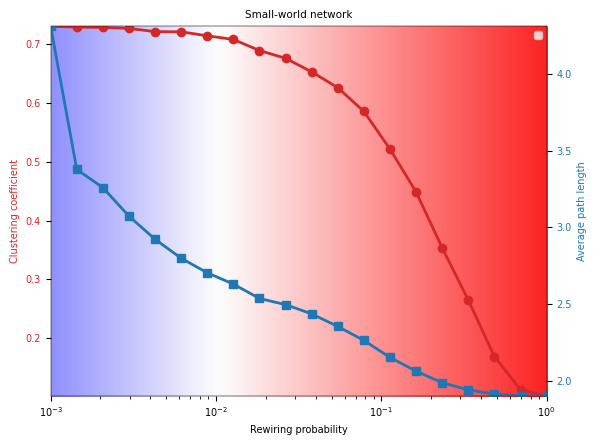

In [13]:
new_p = np.logspace(np.log10(0.001), np.log10(1), num=5000, endpoint=True)
new_omega = np.linspace(-0.438, 0.86, 5000)

# Define colors for the overlay
cmap = plt.get_cmap('bwr')
colors = cmap(0.5 * (np.asarray(new_omega) + 1))  # Map omega to colors between green and red
colors_rgba = cmap(0.5 * (np.asarray(new_omega) + 1), alpha=0.3)  # Convert to RGBA with alpha=0.3

# Create polygon vertices
vertices = np.vstack((np.array([new_p[0], 0]), np.column_stack((new_p, new_omega)), np.array([new_p[-1], 0])))

fig, ax1 = plt.subplots()

# Plot the filled polygon
for i, color in enumerate(colors_rgba):
    ax1.fill_between([vertices[i, 0], vertices[i+1, 0]], 
                    np.min(clustering_coef), np.max(clustering_coef), color=color)
    
# Plot the graph
color = 'tab:red'
ax1.set_xlabel('Rewiring probability')
ax1.set_ylabel('Clustering coefficient', color=color)
ax1.plot(p, clustering_coef, 'o-', color=color) 
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xscale('log')
ax1.set_xlim([np.min(vertices[:, 0]), np.max(vertices[:, 0])])
ax1.set_ylim([np.min(clustering_coef), np.max(clustering_coef)])
ax1.legend(loc=1)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('Average path length', color=color)  
ax2.plot(p, avg_path_length, 's-', color=color) 
ax2.tick_params(axis='y', labelcolor=color)
ax2.set_xscale('log')
ax2.set_ylim([np.min(avg_path_length), np.max(avg_path_length)])

plt.title('Small-world network')
plt.show()

**Panel 1**

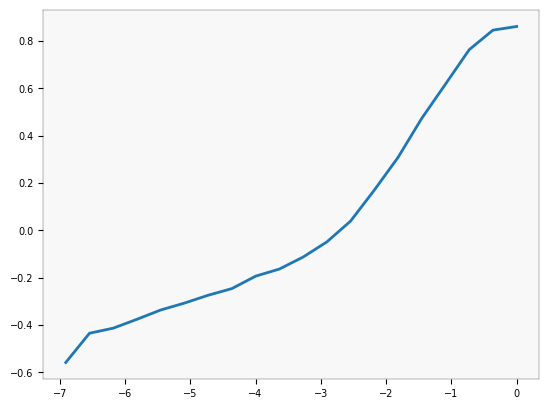

/tmp/ipykernel_2618/3846051019.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.ScalarMappable(norm=norm, cmap=cm.get_cmap('cool'))


In [15]:
omega
f = plt.figure()
plt.plot(np.log(p), omega)
plt.show()

# Define the number of points to add between each pair of adjacent points
num_interp_points = 1000

# Use numpy.interp to interpolate new values for the color scale
new_omega = np.interp(new_p, p, omega)

# Draw overlay
# Normalize the color scale to map values to the [0, 1] range
norm = Normalize(vmin=min(new_omega), vmax=max(new_omega))

# Create a colormap based on the color scale and the normalized values
cmap = cm.ScalarMappable(norm=norm, cmap=cm.get_cmap('cool'))

# Create the overlay with the varying colors
for i in range(len(new_p)-1):
    c = new_omega[i]

/tmp/ipykernel_2618/3678261714.py:139: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([-0.43, -0.36, -0.23, 0.29, 0.41, 0.86])


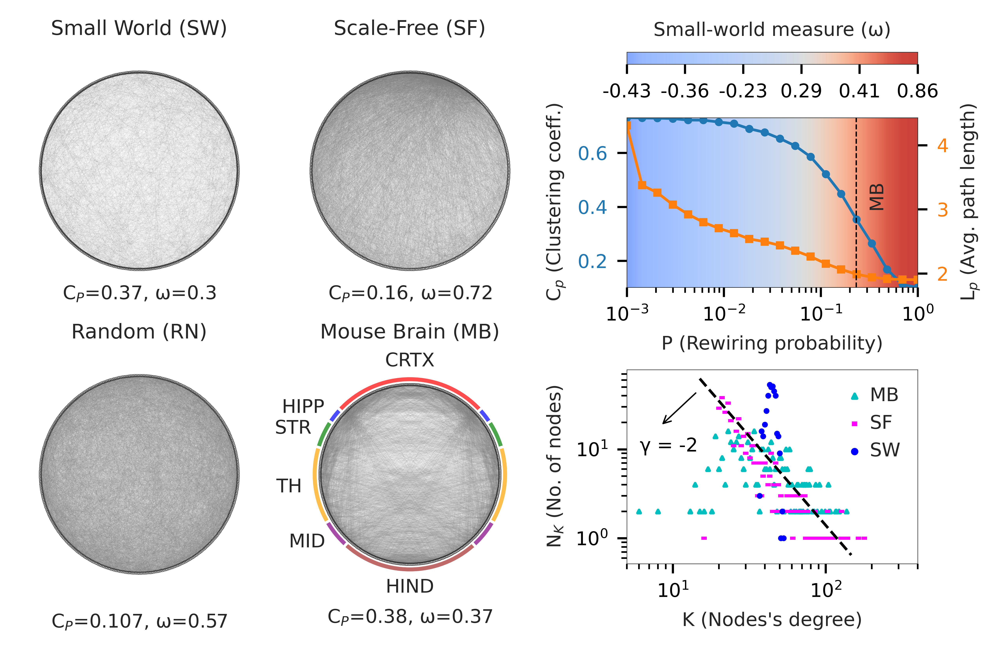

In [19]:
import seaborn as sns
import matplotlib

sns.set_style("white", {"axes.labelsize": 12})
style_dict = sns.axes_style()
style_dict['xtick.bottom'] = True
style_dict['ytick.left'] = True
style_dict['xtick.color'] = '0'
style_dict['ytick.color'] = '0'
sns.set_style(style_dict)

fig = plt.figure(figsize=(5, 3.2), dpi=1000)
fig.set_constrained_layout(True)

s_fig = fig.subfigures(1, 1)
subfigs = s_fig.subfigures(1, 2, width_ratios=[7, 6], wspace=-0.2)

gs1 = GridSpec(2, 2, figure=subfigs[0], hspace=-1, wspace=-1)

ax1 = subfigs[0].add_subplot(gs1[0, 0], aspect='equal')
ax2 = subfigs[0].add_subplot(gs1[0, 1], aspect='equal')
ax4 = subfigs[0].add_subplot(gs1[1, 0], aspect='equal')
ax5 = subfigs[0].add_subplot(gs1[1, 1], aspect='equal')

gs2 = GridSpec(31, 1, figure=subfigs[1], hspace=0)
ax3 = subfigs[1].add_subplot(gs2[1:15])
ax6 = subfigs[1].add_subplot(gs2[15:])
ax7 = subfigs[1].add_subplot(gs2[0])

# Graph params
node_size = 0.01
edge_width = 0.01
node_color = 'black'
edge_color = 'gray'

"""
----------------------------------------------------------------------------
SWN
----------------------------------------------------------------------------
"""
ax1.set_title('Small World (SW)', fontsize=TITLE_FONT_SIZE)
pos1 = nx.circular_layout(G_SWN)
nx.draw_networkx(G_SWN, pos1, node_size=node_size, width=edge_width, node_color=node_color, 
                 edge_color=edge_color, with_labels=False, ax=ax1)
ax1.set_axis_off()
ax1.text(0, -1.25, r'C$_P$=0.37, ω=0.3', ha='center', va='center')
    
"""
----------------------------------------------------------------------------
MBN
----------------------------------------------------------------------------
"""
ax5.set_title('Mouse Brain (MB)', fontsize=TITLE_FONT_SIZE)

scaling_factor = 0.94  
pos2_scaled = {node: scaling_factor * coord for node, coord in pos2.items()}

nx.draw_networkx(G_MB, pos2_scaled, nodelist=left_nodes+right_nodes, edgelist=G_MB.edges(),
                 node_size=node_size, width=edge_width, node_color=node_color, 
                 edge_color=edge_color, with_labels=False, ax=ax5)
ax5.set_axis_off()
ax5.text(0, -1.5, r'C$_P$=0.38, ω=0.37', ha='center', va='center')

concatenated_list = np.array([112, 11, 20, 55, 21, 100, 21, 55, 20, 11])
region_colors = np.array(['red', 'blue', 'green', 'orange', 'purple', 'brown','purple', 'orange', 'green', 'blue'])
colors = [mcolors.to_rgba(c, alpha=0.7) for c in region_colors]
anatomical_region_labels = np.array(['CRTX', 'HIPP', 'STR', 'TH', 'MID', 'HIND', None, None, None, None])

ax5.pie(concatenated_list, radius=1.03, 
        startangle=42.67, colors=colors, #137.32, 
        wedgeprops=dict(width=0.07), 
        textprops={'fontsize': TEXT_FONT_SIZE},
        labels=anatomical_region_labels) 

# Horizontally center only two labels
label_indices_to_center = [1, 6]  # Specify the indices of the labels to be centered
for i in label_indices_to_center:
    ax5.texts[i].set_horizontalalignment('center')
    if i == 1:
        vertical_spacing = -0.05
        ax5.texts[i].set_y(ax5.texts[i].get_position()[1] - vertical_spacing)
    elif i==6: 
        vertical_spacing = 0.05
        ax5.texts[i].set_y(ax5.texts[i].get_position()[1] - vertical_spacing)

"""
----------------------------------------------------------------------------
SF
----------------------------------------------------------------------------
"""
ax2.set_title('Scale-Free (SF)', fontsize=TITLE_FONT_SIZE)
nx.draw_networkx(G_SF, pos_sf, node_size=node_size, width=edge_width, 
                 node_color=node_color, edge_color=edge_color, with_labels=False, ax=ax2)
ax2.set_axis_off()
trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax2.text(0, -1.25, r'C$_P$=0.16, ω=0.72', ha='center', va='center')


"""
----------------------------------------------------------------------------
Random Network
----------------------------------------------------------------------------
"""
ax4.set_title('Random (RN)', fontsize=TITLE_FONT_SIZE)
pos4 = nx.circular_layout(G_RND)
nx.draw_networkx(G_RND, pos4, node_size=node_size, width=edge_width, node_color=node_color, edge_color=edge_color, with_labels=False, ax=ax4)
ax4.set_axis_off()
trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax4.text(0, -1.5, r'C$_P$=0.107, ω=0.57', ha='center', va='center')


"""
----------------------------------------------------------------------------
C & L vs P
----------------------------------------------------------------------------
"""
# Define colors for the overlay
cmap = plt.get_cmap('coolwarm')
colors = cmap(0.5 * (np.asarray(new_omega) + 1))  
colors_rgba = cmap(0.5 * (np.asarray(new_omega) + 1), alpha=0.3)  

# Create polygon vertices
vertices = np.vstack((np.array([new_p[0], 0]), np.column_stack((new_p, new_omega)), np.array([new_p[-1], 0])))

# Plot the filled polygon
for i, color in enumerate(colors_rgba):
    ax3.fill_between([vertices[i, 0], vertices[i+1, 0]], 
                    np.min(clustering_coef), np.max(clustering_coef), color=color)

ax3.set_xlim([np.min(vertices[:, 0]), np.max(vertices[:, 0])])
ax3.set_ylim([np.min(clustering_coef), np.max(clustering_coef)])

# Define the colormap from the RGBA color values
my_cmap = mcolors.ListedColormap(colors_rgba)

# Create a colorbar for the first subplot (ax1)
sm = plt.cm.ScalarMappable(cmap=my_cmap)
cbar = plt.colorbar(sm, cax=ax7, orientation='horizontal')
cbar.set_ticklabels([-0.43, -0.36, -0.23, 0.29, 0.41, 0.86])
ax7.set_title('Small-world measure (ω)',  fontsize=TEXT_FONT_SIZE)

color = 'tab:blue'
ax3.set_xlabel('P (Rewiring probability)')
ax3.set_ylabel(r'C$_p$ (Clustering coeff.)')
ax3.plot(p, clustering_coef, 'o-', color=color, linewidth=LINE_WIDTH, 
         markersize=MARKER_SIZE) 
ax3.tick_params(axis='y', labelcolor=color)
ax3.set_xscale('log')
ax3.set_title('')

ax3_ = ax3.twinx() 

color = 'tab:orange'
ax3_.set_ylabel(r'L$_p$ (Avg. path length)')
ax3_.plot(p, avg_path_length, 's-', color=color, linewidth=LINE_WIDTH, 
          markersize=MARKER_SIZE) 
ax3_.tick_params(axis='y', labelcolor=color)
ax3_.set_xscale('log')

ax3_.axvline(x=0.232, color='k', linestyle='--', linewidth=0.5, alpha=1, label="MB", zorder=20)
ax3_.text(0.302, 0.48, "MB", transform=ax3.get_xaxis_transform(), rotation=90)

trans = mtransforms.ScaledTranslation(-60/72, 7/72, fig.dpi_scale_trans)


"""
----------------------------------------------------------------------------
Power law distribution (SF)
----------------------------------------------------------------------------
"""
ax6.scatter(unique_degrees, count_degrees, s=MARKER_SIZE-0.7, 
            color="c", label="MB", alpha=1, marker="^")
ax6.scatter(sf_unique_degrees, sf_count_degrees, s=MARKER_SIZE-0.7, 
            color="magenta", label="SF", alpha=1, marker="|")
ax6.scatter(swn_unique_degrees, swn_count_degrees, s=MARKER_SIZE-0.7, 
            color="blue", label="SW", alpha=1)
ax6.plot(x_line, y_line, color='black', linestyle='--', 
         linewidth=LINE_WIDTH) 

# Draw the curved arrow
arrow_start = ( x_line[0] , y_line[0] - 15 )  
arrow_end = ( x_line[0] - 7, y_line[0] - 45 ) 
arrow_center = ((arrow_start[0] + arrow_end[0]) / 2, (arrow_start[1] + arrow_end[1]) / 2)  

ax6.annotate('', arrow_end, arrow_start, arrowprops={'arrowstyle': '->', 'color': 'black', 'linewidth': 0.5})

# Add text to the arrow
text = 'γ = -2'
ax6.annotate(text, arrow_end, xytext=(4, -10), textcoords='offset points',
              ha='center', va='bottom', color='black', fontsize=TEXT_FONT_SIZE)


ax6.set_xscale('log')
ax6.set_yscale('log')
ax6.set_xlabel('K (Nodes\'s degree)')
ax6.set_ylabel(r'N$_K$ (No. of nodes)')
ax6.legend(bbox_to_anchor=(1, 1), loc=1, frameon=False, 
           markerscale=1.5, handletextpad=-0.2)

trans = mtransforms.ScaledTranslation(-60/72, 7/72, fig.dpi_scale_trans)
ax6.set_xlim(left=5, right=400)

plt.show()

**Node centrality**

In [20]:
# Calculate the degree centrality
degree_centrality_mb = nx.degree_centrality(G_MB)

node_centrality_mb = np.zeros(426)
# Print the degree centrality of each node
for node, centrality in degree_centrality_mb.items():
    node_centrality_mb[node] = centrality


degree_centrality_sw = nx.degree_centrality(G_SWN)

node_centrality_sw = np.zeros(426)
# Print the degree centrality of each node
for node, centrality in degree_centrality_sw.items():
    node_centrality_sw[node] = centrality
    
degree_centrality_sf = nx.degree_centrality(G_SF)

node_centrality_sf = np.zeros(426)
# Print the degree centrality of each node
for node, centrality in degree_centrality_sf.items():
    node_centrality_sf[node] = centrality

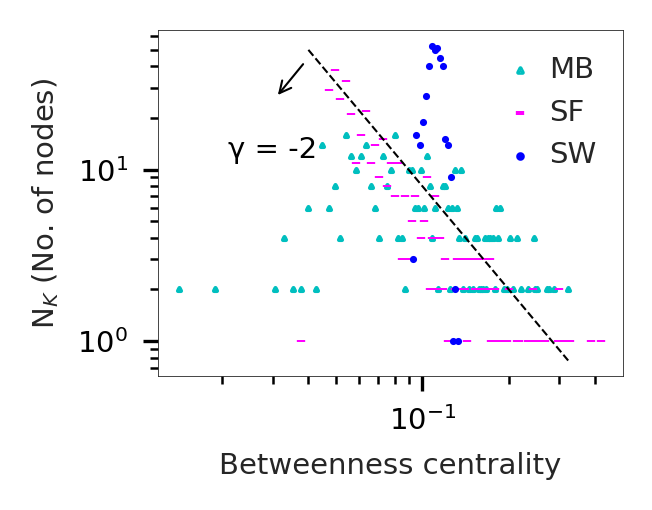

In [21]:
centrality_dist_mb = np.asarray(node_centrality_mb)
unique_centrality_mb = np.unique(centrality_dist_mb)
count_centrality_mb = [np.count_nonzero(centrality_dist_mb == centrality) for centrality in unique_centrality_mb]

centrality_dist_sf = np.asarray(node_centrality_sf)
unique_centrality_sf = np.unique(centrality_dist_sf)
count_centrality_sf = [np.count_nonzero(centrality_dist_sf == centrality) for centrality in unique_centrality_sf]

centrality_dist_sw = np.asarray(node_centrality_sw)
unique_centrality_sw = np.unique(centrality_dist_sw)
count_centrality_sw = [np.count_nonzero(centrality_dist_sw == centrality) for centrality in unique_centrality_sw]

x_line = np.array([0.04, 1*max(unique_centrality_mb)])
y_line = 0.08*x_line**(-2)

fig = plt.figure(figsize=(2, 1.5), dpi=300)

plt.scatter(unique_centrality_mb, count_centrality_mb, s=0.5, color="c", label="MB", marker="^")
plt.scatter(unique_centrality_sf, count_centrality_sf, s=0.5, color="magenta", label="SF", marker="|")
plt.scatter(unique_centrality_sw, count_centrality_sw, s=0.5, color="blue", label="SW")
plt.plot(x_line, y_line, color='black', linestyle='--', linewidth=0.5*LINE_WIDTH)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Betweenness centrality')
plt.ylabel(r'N$_K$ (No. of nodes)')

plt.legend(bbox_to_anchor=(1, 1), loc=1, 
           handletextpad=0,
           frameon=False, markerscale=1.5)

# Draw the curved arrow
arrow_start = ( x_line[0] , y_line[0] - 5 )  # Starting point of the arrow
arrow_end = ( x_line[0]-0.01, y_line[0] - 25 ) #(x_line[-1], y_line[-1])  # Ending point of the arrow
arrow_center = ((arrow_start[0] + arrow_end[0]) / 2, (arrow_start[1] + arrow_end[1]) / 2)  # Center point of the arrow

plt.annotate('', arrow_end, arrow_start, 
             arrowprops={'arrowstyle': '->', 'color': 'black', 'linewidth': 0.5})

# Add text to the arrow
text = 'γ = -2'
plt.annotate(text, arrow_end, xytext=(0, -15), textcoords='offset points',
              ha='center', va='bottom', color='black')


plt.show()